In [1]:
import numpy as np
import pandas as pd
# import scanpy.api as sc
import scanpy as sc
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

import matplotlib as mpl
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
mpl.rcParams['pdf.fonttype'] = 42
mpl.rcParams['ps.fonttype'] = 42

In [2]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, color_map='viridis', transparent=False, frameon=False)  # low dpi (dots per inch) yields small inline figures

import matplotlib as mpl
# 2 lines below solved the facecolor problem.
# mpl.rcParams['figure.facecolor'] = 'white'
mpl.rcParams['figure.facecolor'] = (1,1,1,1)
sc.settings.autosave = True
sc.logging.print_versions()

version = '210430_integration_all'

results_file_yy = './scanpy/210430_merged_thymoma_MG21.22.23.03/merge.minor_cluster.h5ad'
results_file_raw_yy = './scanpy/210430_merged_thymoma_MG21.22.23.03/merge.raw.h5ad'
results_file_park = './Park_et_al/thymus_code_package/analysis_anndata_annotation.h5ad'
results_file_raw_park = './Park_et_al/HTA07.A01.v02.entire_data_raw_count.h5ad'
results_file_hao = './data/pbmc_multimodal.h5ad'

sc.settings.figdir = './scanpy/{}/graph'.format(version)
sc.settings.cachedir = './scanpy/{}/cache'.format(version)
%config InlineBackend.figure_format = 'retina'

-----
anndata     0.7.6
scanpy      1.7.2
sinfo       0.3.1
-----
PIL                 8.1.2
anndata             0.7.6
backcall            0.2.0
cffi                1.14.5
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
dateutil            2.8.1
decorator           4.4.2
get_version         2.1
google              NA
h5py                2.10.0
igraph              0.9.1
ipykernel           5.3.4
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.17.2
joblib              1.0.1
kiwisolver          1.3.1
legacy_api_wrap     1.2
leidenalg           0.8.4
llvmlite            0.34.0
matplotlib          3.4.1
mpl_toolkits        NA
natsort             7.1.1
numba               0.51.0
numexpr             2.7.3
numpy               1.20.2
packaging           20.9
pandas              1.2.4
parso               0.7.0
pexpect             4.8.0
pickleshare         0.7.5
pkg_resources       NA
prompt_toolkit      3.0.8
psutil              5.8.0
ptyproce

In [3]:
adata_hao = sc.read(results_file_hao)
adata_hao.uns = adata_hao.uns.pop("neighbors")
adata_hao.obsm['X_umap'] = adata_hao.obsm['X_wnn.umap']
adata_hao.obs['celltype.l3'] = 'H:'+adata_hao.obs['celltype.l3'].astype(str)

/home/yyasumizu/anaconda3/envs/scanpy1.7.2/lib/python3.7/site-packages/anndata/compat/__init__.py:183: FutureWarning: Moving element from .uns['neighbors']['distances'] to .obsp['distances'].

This is where adjacency matrices should go now.
  FutureWarning,


In [4]:
adata_hao

AnnData object with n_obs × n_vars = 161764 × 20729
    obs: 'nCount_ADT', 'nFeature_ADT', 'nCount_RNA', 'nFeature_RNA', 'orig.ident', 'lane', 'donor', 'time', 'celltype.l1', 'celltype.l2', 'celltype.l3', 'Phase', 'nCount_SCT', 'nFeature_SCT'
    var: 'features'
    uns: 'params'
    obsm: 'X_apca', 'X_aumap', 'X_pca', 'X_spca', 'X_umap', 'X_wnn.umap'
    varm: 'PCs', 'SPCA'
    obsp: 'distances'

... storing 'orig.ident' as categorical
... storing 'lane' as categorical
... storing 'donor' as categorical
... storing 'time' as categorical
... storing 'celltype.l1' as categorical
... storing 'celltype.l2' as categorical
... storing 'celltype.l3' as categorical
... storing 'Phase' as categorical


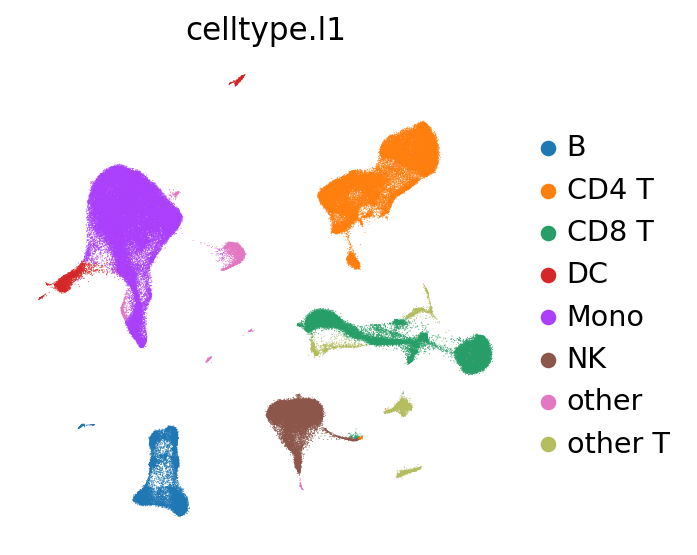

In [5]:
sc.pl.umap(adata_hao, color='celltype.l1')

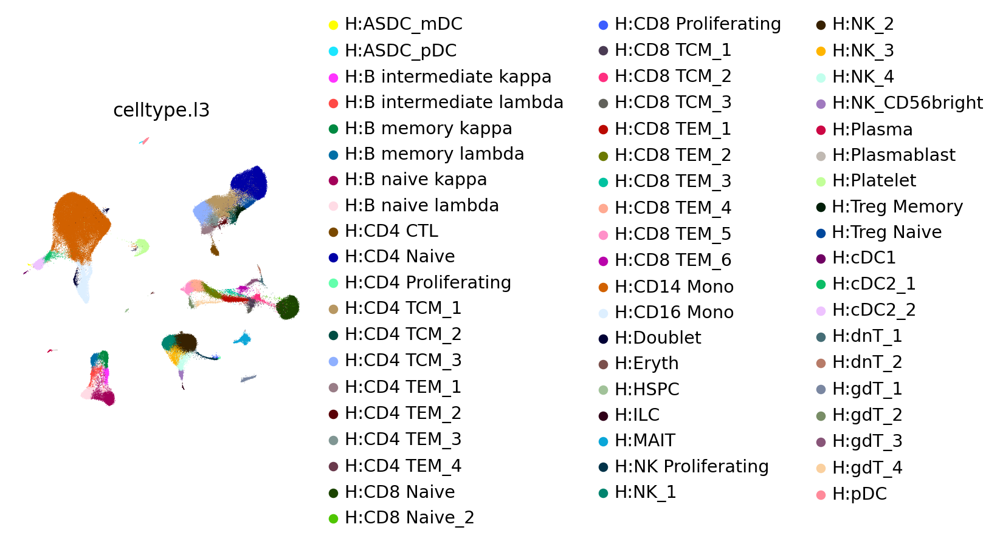

In [6]:
sc.pl.umap(adata_hao, color='celltype.l3')

In [7]:
adata_yy = sc.read(results_file_yy)
adata_yy = adata_yy[adata_yy.obs['site'] == "Periphery"]
adata_yy.obs['minor_cluster'] = 'Y:'+adata_yy.obs['minor_cluster'].astype(str)

Trying to set attribute `.obs` of view, copying.


In [8]:
adata_yy

AnnData object with n_obs × n_vars = 30810 × 1506
    obs: 'sample', 'sample_type', 'site', 'fraction', 'n_genes', 'individual', 'n_counts', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'leiden', 'leiden_R', 'major_cluster', 'score_DEGs', 'score_yellow', 'score_GWAS', 'score_GWAS_wo_HLA', 'minor_cluster', 'score_autoantibodies', 'score_black', 'score_turquoise', 'score_blue', 'score_green', 'score_red', 'score_grey'
    var: 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'mean', 'std'
    uns: 'dendrogram_leiden_R', 'dendrogram_major_cluster', 'dendrogram_minor_cluster', 'individual_colors', 'leiden', 'leiden_R_colors', 'leiden_colors', 'major_cluster_colors', 'minor_cluster_colors', 'neighbors', 'pca', 'rank_genes_groups', 'sample_colors', 'site_colors', 'umap'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'connectivities', 'distances'

... storing 'minor_cluster' as categorical


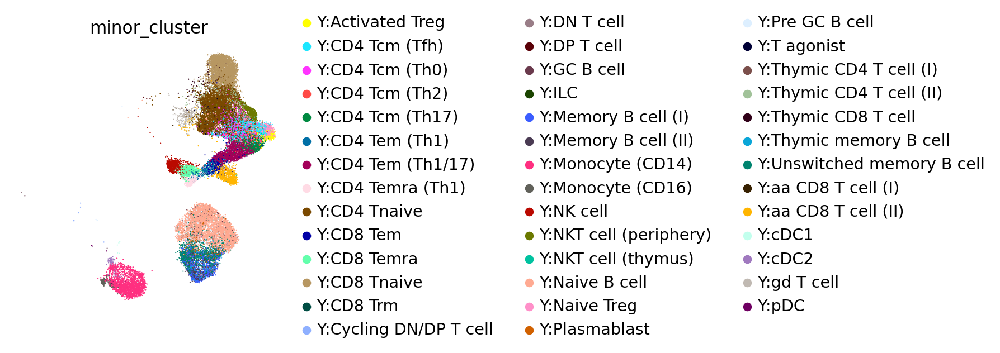

In [9]:
sc.pl.umap(adata_yy, color='minor_cluster')

normalizing by total count per cell
    finished (0:03:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:02)


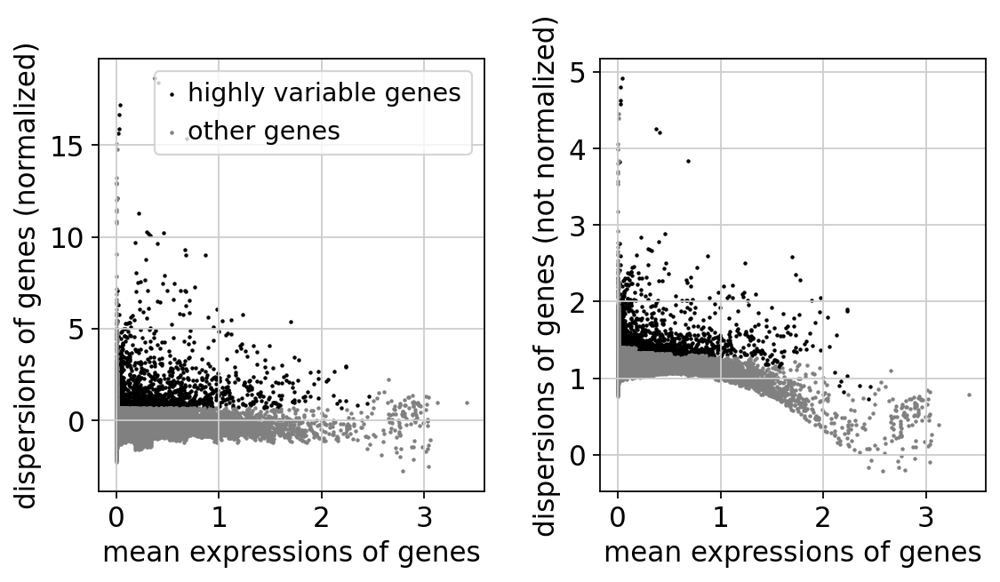

[1620, 20729]


/home/yyasumizu/anaconda3/envs/scanpy1.7.2/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:375: UserWarning: Revieved a view of an AnnData. Making a copy.
  view_to_actual(adata)
... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [10]:
adata_hao.raw = sc.pp.log1p(adata_hao, copy=True)
sc.pp.normalize_per_cell(adata_hao, counts_per_cell_after=1e4)

filter_result = sc.pp.filter_genes_dispersion(
    adata_hao.X, min_mean=0.0125, max_mean=2.5, min_disp=0.7)
sc.pl.filter_genes_dispersion(filter_result)
print([sum([i[0] for i in filter_result]),len(filter_result)])

adata_hao = adata_hao[:, filter_result.gene_subset]
sc.pp.log1p(adata_hao)
sc.pp.scale(adata_hao, max_value=10)

In [11]:
var_names = adata_hao.var_names.intersection(adata_yy.var_names)
adata_hao = adata_hao[:, var_names]
adata_yy = adata_yy[:, var_names]

In [12]:
sc.pp.pca(adata_hao)
sc.pp.neighbors(adata_hao, n_pcs=50)
sc.tl.umap(adata_hao)
sc.tl.ingest(adata_yy, adata_hao, obs='celltype.l3')

computing PCA
    with n_comps=50
    finished (0:00:36)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:46)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:17)
running ingest
    finished (0:00:21)


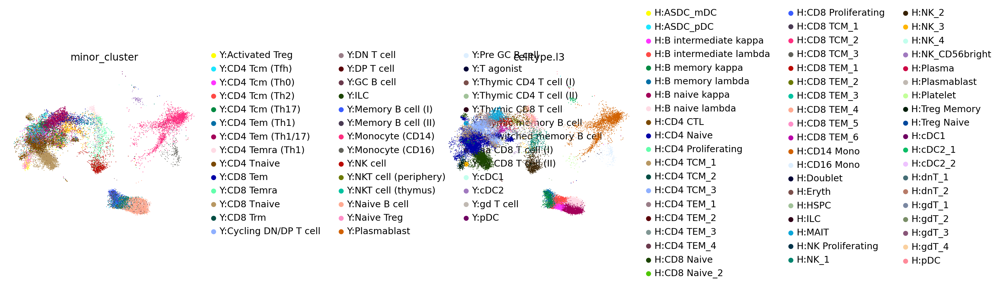

In [13]:
sc.pl.umap(adata_yy, color=['minor_cluster', 'celltype.l3'], wspace=1)

In [14]:
df_cross = pd.crosstab(adata_yy.obs['minor_cluster'], adata_yy.obs['celltype.l3'])
df_cross

celltype.l3,H:ASDC_pDC,H:B intermediate kappa,H:B intermediate lambda,H:B memory kappa,H:B memory lambda,H:B naive kappa,H:B naive lambda,H:CD4 CTL,H:CD4 Naive,H:CD4 TCM_1,...,H:cDC1,H:cDC2_1,H:cDC2_2,H:dnT_1,H:dnT_2,H:gdT_1,H:gdT_2,H:gdT_3,H:gdT_4,H:pDC
minor_cluster,,,,,,,,,,,,,,,,,,,,,
Y:Activated Treg,0,0,0,0,0,0,0,1,12,89,...,0,0,0,0,0,0,0,1,0,0
Y:CD4 Tcm (Tfh),0,0,0,0,0,0,0,0,294,423,...,0,0,0,1,4,0,0,0,0,0
Y:CD4 Tcm (Th0),0,0,0,0,0,0,0,0,543,191,...,0,0,0,0,0,0,0,0,0,0
Y:CD4 Tcm (Th2),0,0,0,0,0,0,0,0,94,102,...,0,0,0,0,0,0,0,0,0,0
Y:CD4 Tcm (Th17),0,0,0,0,0,0,0,0,99,86,...,0,0,0,0,0,0,0,0,0,0
Y:CD4 Tem (Th1),0,0,0,0,0,0,0,49,0,1,...,0,0,0,0,0,9,1,0,0,0
Y:CD4 Tem (Th1/17),0,0,0,0,0,0,0,36,53,21,...,0,0,0,0,0,15,0,1,0,0
Y:CD4 Temra (Th1),0,0,0,0,0,0,0,70,2,1,...,0,0,0,0,0,8,6,0,0,0
Y:CD4 Tnaive,0,0,0,0,0,0,0,0,5546,200,...,0,0,0,0,0,0,0,4,0,0


In [15]:
df_cross.index = df_cross.index.astype(str)
df_cross.columns = df_cross.columns.astype(str)
df_cross['color'] = list(adata_yy.uns['minor_cluster_colors'])
df_cross_melt = df_cross.reset_index().melt(id_vars=['minor_cluster', 'color'])
df_cross_melt = df_cross_melt[df_cross_melt['value'] > 0]

dict_ind = {k:i for i,k in enumerate(list(df_cross.index)+list(df_cross.columns))}

In [16]:
dict_ind

{'Y:Activated Treg': 0,
 'Y:CD4 Tcm (Tfh)': 1,
 'Y:CD4 Tcm (Th0)': 2,
 'Y:CD4 Tcm (Th2)': 3,
 'Y:CD4 Tcm (Th17)': 4,
 'Y:CD4 Tem (Th1)': 5,
 'Y:CD4 Tem (Th1/17)': 6,
 'Y:CD4 Temra (Th1)': 7,
 'Y:CD4 Tnaive': 8,
 'Y:CD8 Tem': 9,
 'Y:CD8 Temra': 10,
 'Y:CD8 Tnaive': 11,
 'Y:CD8 Trm': 12,
 'Y:Cycling DN/DP T cell': 13,
 'Y:DN T cell': 14,
 'Y:DP T cell': 15,
 'Y:GC B cell': 16,
 'Y:ILC': 17,
 'Y:Memory B cell (I)': 18,
 'Y:Memory B cell (II)': 19,
 'Y:Monocyte (CD14)': 20,
 'Y:Monocyte (CD16)': 21,
 'Y:NK cell': 22,
 'Y:NKT cell (periphery)': 23,
 'Y:NKT cell (thymus)': 24,
 'Y:Naive B cell': 25,
 'Y:Naive Treg': 26,
 'Y:Plasmablast': 27,
 'Y:Pre GC B cell': 28,
 'Y:T agonist': 29,
 'Y:Thymic CD4 T cell (I)': 30,
 'Y:Thymic CD4 T cell (II)': 31,
 'Y:Thymic CD8 T cell': 32,
 'Y:Thymic memory B cell': 33,
 'Y:Unswitched memory B cell': 34,
 'Y:aa CD8 T cell (I)': 35,
 'Y:aa CD8 T cell (II)': 36,
 'Y:cDC1': 37,
 'Y:cDC2': 38,
 'Y:gd T cell': 39,
 'Y:pDC': 40,
 'H:ASDC_pDC': 41,
 'H:B interme

In [17]:
df_cross

celltype.l3,H:ASDC_pDC,H:B intermediate kappa,H:B intermediate lambda,H:B memory kappa,H:B memory lambda,H:B naive kappa,H:B naive lambda,H:CD4 CTL,H:CD4 Naive,H:CD4 TCM_1,...,H:cDC2_1,H:cDC2_2,H:dnT_1,H:dnT_2,H:gdT_1,H:gdT_2,H:gdT_3,H:gdT_4,H:pDC,color
minor_cluster,,,,,,,,,,,,,,,,,,,,,
Y:Activated Treg,0,0,0,0,0,0,0,1,12,89,...,0,0,0,0,0,0,1,0,0,#FFFF00
Y:CD4 Tcm (Tfh),0,0,0,0,0,0,0,0,294,423,...,0,0,1,4,0,0,0,0,0,#1CE6FF
Y:CD4 Tcm (Th0),0,0,0,0,0,0,0,0,543,191,...,0,0,0,0,0,0,0,0,0,#FF34FF
Y:CD4 Tcm (Th2),0,0,0,0,0,0,0,0,94,102,...,0,0,0,0,0,0,0,0,0,#FF4A46
Y:CD4 Tcm (Th17),0,0,0,0,0,0,0,0,99,86,...,0,0,0,0,0,0,0,0,0,#008941
Y:CD4 Tem (Th1),0,0,0,0,0,0,0,49,0,1,...,0,0,0,0,9,1,0,0,0,#006FA6
Y:CD4 Tem (Th1/17),0,0,0,0,0,0,0,36,53,21,...,0,0,0,0,15,0,1,0,0,#A30059
Y:CD4 Temra (Th1),0,0,0,0,0,0,0,70,2,1,...,0,0,0,0,8,6,0,0,0,#FFDBE5
Y:CD4 Tnaive,0,0,0,0,0,0,0,0,5546,200,...,0,0,0,0,0,0,4,0,0,#7A4900


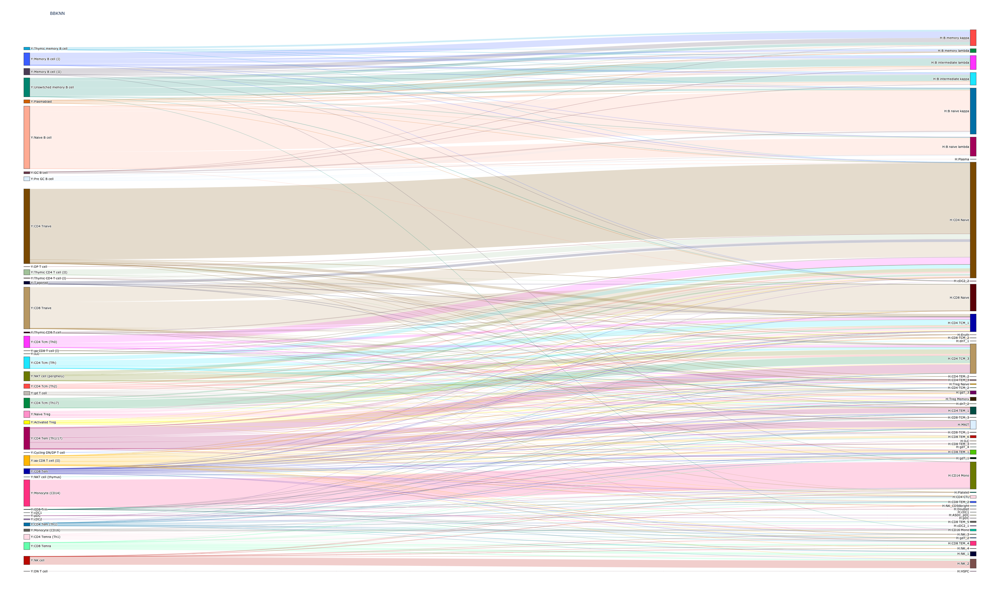

In [18]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 10,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = list(dict_ind.keys()),
      color = list(adata_yy.uns['minor_cluster_colors']) + list(adata_yy.uns['celltype.l3_colors'])
    ),
    link = dict(
      source = [dict_ind[k] for k in df_cross_melt['minor_cluster']],
      target = [dict_ind[k] for k in df_cross_melt['celltype.l3']],
      value = list(df_cross_melt['value']),
      color = ["rgba({},{},{},0.2)".format(int(c.lstrip('#')[0:2], 16), int(c.lstrip('#')[2:4], 16), 
                                           int(c.lstrip('#')[4:6], 16)) for c in df_cross_melt['color']]
  ))])

fig.update_layout(title_text="BBKNN", font_size=10,  width=500, height=2000,)
fig.show()

In [19]:
fig.write_html("scanpy/210430_merged_thymoma_MG21.22.23.03/Sankey_Yasumizu_Hao.html")

In [20]:
fig.write_image("scanpy/210430_merged_thymoma_MG21.22.23.03/Sankey_Yasumizu_Hao.png")

## Integration with the normal thymus

In [21]:
adata_park = sc.read(results_file_park)
adata_raw_park = sc.read(results_file_raw_park)

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Only considering the two last: ['.entire_data_raw_count', '.h5ad'].
Only considering the two last: ['.entire_data_raw_count', '.h5ad'].
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


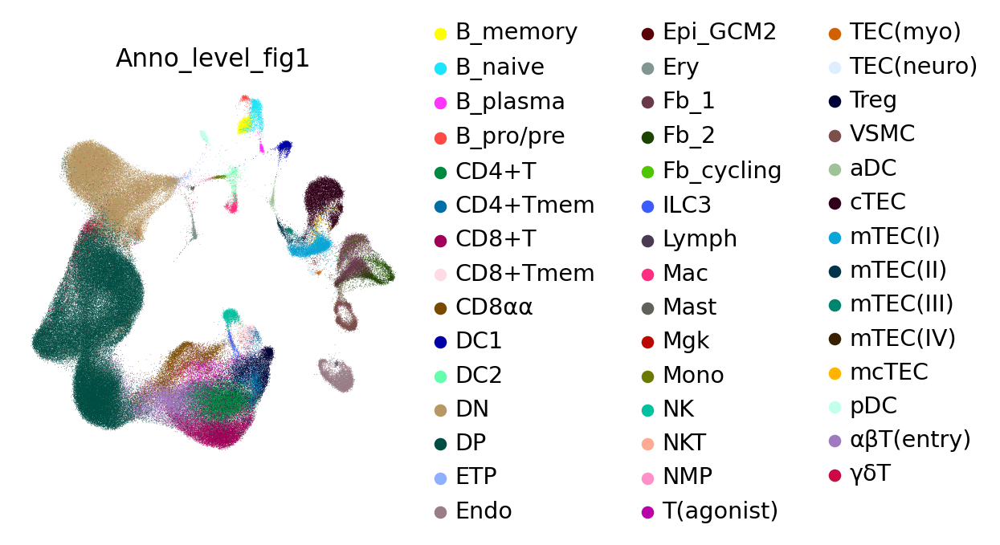

In [22]:
sc.pl.umap(adata_park, color='Anno_level_fig1')

In [23]:
adata_park.obs['cluster'] = 'P:'+adata_park.obs['Anno_level_3'].astype(str)
# adata_park.obs['age'] = df_obs_park['Age']
# adata_park.obs['sample'] = df_obs_park['Sample']z
# adata_park.obs['dataset'] = 'Park_et_al'

# adata_park = adata_park[adata_park.obs['Anno_level_1'].isin(['Innate_T', 'T', 'Innate_lymphoid'])]
adata_raw_park = adata_raw_park[adata_park.obs.index]
adata_raw_park.obs = adata_park.obs
adata_raw_park.var_names_make_unique()

adata_park = adata_raw_park.copy()
adata_raw_park = None
# adata_park.X = np.array(adata_raw_park[adata_park.obs.index].X.todense())

Variable names are not unique. To make them unique, call `.var_names_make_unique`.
Variable names are not unique. To make them unique, call `.var_names_make_unique`.


In [24]:
adata_yy = sc.read(results_file_yy)
adata_yy = adata_yy[adata_yy.obs['site'] == "Thymus"]
adata_yy.obs['minor_cluster'] = 'Y:'+adata_yy.obs['minor_cluster'].astype(str)

Trying to set attribute `.obs` of view, copying.


... storing 'minor_cluster' as categorical


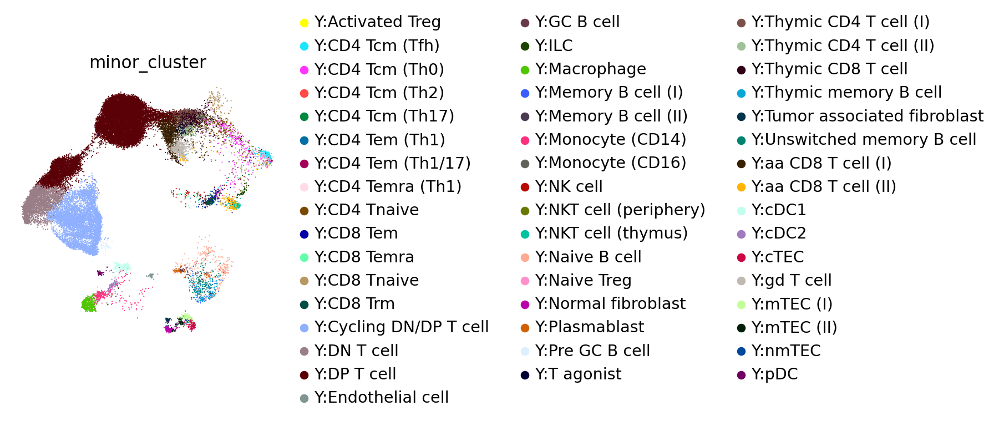

In [25]:
sc.pl.umap(adata_yy, color='minor_cluster')

normalizing by total count per cell
    finished (0:03:12): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)
extracting highly variable genes
    finished (0:00:03)


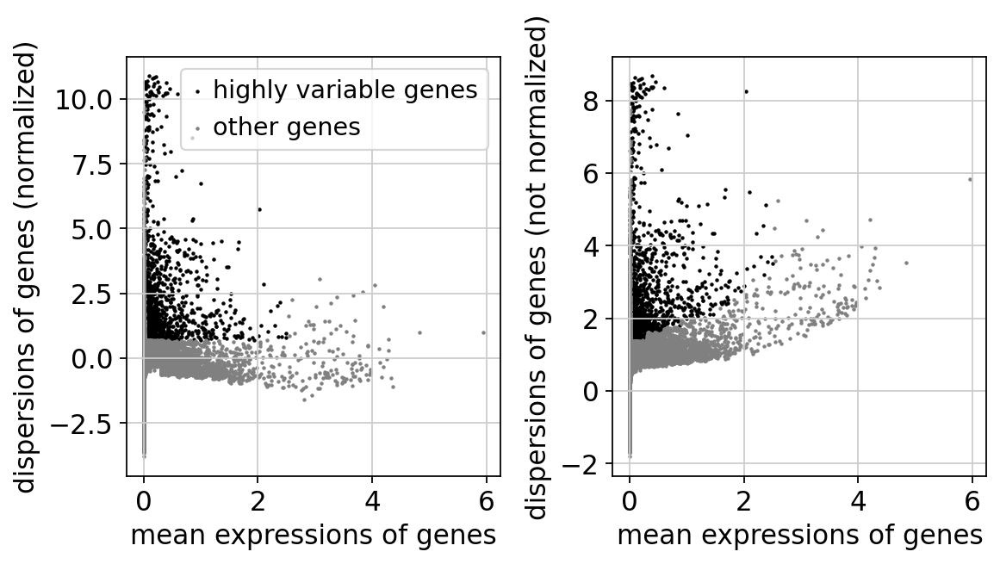

[1399, 33694]


/home/yyasumizu/anaconda3/envs/scanpy1.7.2/lib/python3.7/site-packages/scanpy/preprocessing/_simple.py:375: UserWarning:

Revieved a view of an AnnData. Making a copy.

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption


In [26]:
adata_park.raw = sc.pp.log1p(adata_park, copy=True)
sc.pp.normalize_per_cell(adata_park, counts_per_cell_after=1e4)

filter_result = sc.pp.filter_genes_dispersion(
    adata_park.X, min_mean=0.0125, max_mean=2.5, min_disp=0.7)
sc.pl.filter_genes_dispersion(filter_result)
print([sum([i[0] for i in filter_result]),len(filter_result)])

adata_park = adata_park[:, filter_result.gene_subset]
sc.pp.log1p(adata_park)
sc.pp.scale(adata_park, max_value=10)

In [27]:
var_names = adata_park.var_names.intersection(adata_yy.var_names)
adata_park = adata_park[:, var_names]
adata_yy = adata_yy[:, var_names]

In [28]:
sc.pp.pca(adata_park)
sc.pp.neighbors(adata_park, n_pcs=50)
sc.tl.umap(adata_park)
sc.tl.ingest(adata_yy, adata_park, obs='cluster')

computing PCA
    with n_comps=50
    finished (0:01:35)
computing neighbors
    using 'X_pca' with n_pcs = 50
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:02:19)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:03:45)
running ingest
    finished (0:00:30)


In [29]:
sc.tl.ingest(adata_yy, adata_park, obs='cluster')

running ingest
    finished (0:00:29)


... storing 'cluster' as categorical


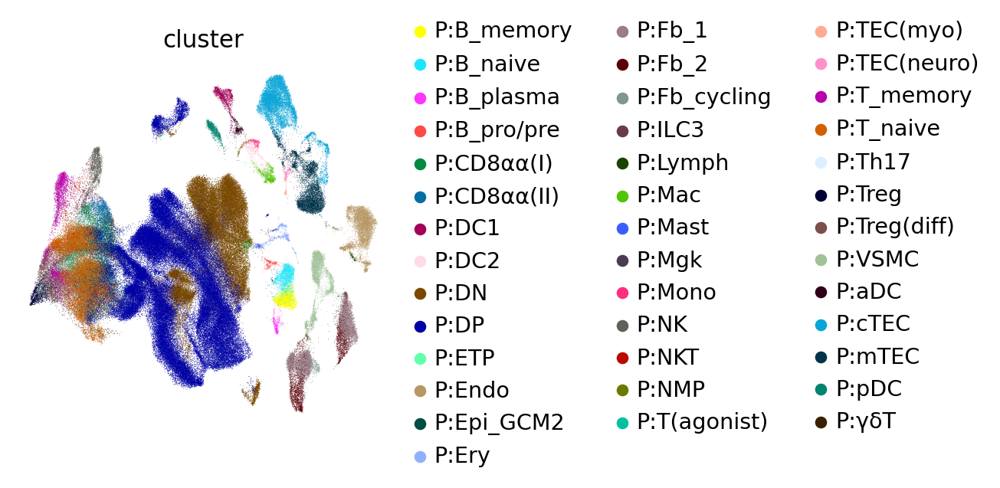

In [30]:
sc.pl.umap(adata_park, color=['cluster'])

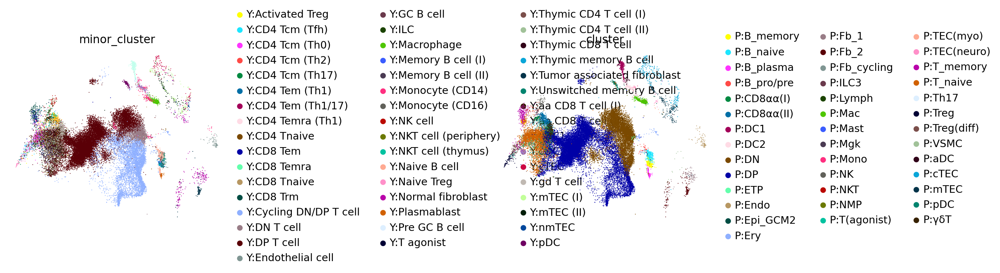

In [31]:
sc.pl.umap(adata_yy, color=['minor_cluster', 'cluster'], wspace=1)

In [32]:
df_cross = pd.crosstab(adata_yy.obs['minor_cluster'], adata_yy.obs['cluster'])
df_cross

cluster,P:B_memory,P:B_naive,P:B_plasma,P:B_pro/pre,P:CD8αα(I),P:CD8αα(II),P:DC1,P:DC2,P:DN,P:DP,...,P:T_naive,P:Th17,P:Treg,P:Treg(diff),P:VSMC,P:aDC,P:cTEC,P:mTEC,P:pDC,P:γδT
minor_cluster,,,,,,,,,,,,,,,,,,,,,
Y:Activated Treg,0,0,0,0,0,0,0,0,0,0,...,1,0,5,5,0,0,0,0,0,0
Y:CD4 Tcm (Tfh),0,0,0,0,7,0,0,0,1,1,...,43,1,8,57,0,0,0,0,0,0
Y:CD4 Tcm (Th0),0,0,0,0,0,0,0,0,0,0,...,224,11,1,15,0,0,0,0,0,0
Y:CD4 Tcm (Th2),0,0,0,0,0,0,0,0,0,0,...,1,0,0,1,0,0,0,0,0,0
Y:CD4 Tcm (Th17),0,0,0,0,0,0,0,0,0,0,...,6,0,8,0,0,0,0,0,0,0
Y:CD4 Tem (Th1),0,0,0,0,0,0,0,0,0,0,...,1,0,0,0,0,0,0,0,0,0
Y:CD4 Tem (Th1/17),0,0,0,0,0,1,0,0,0,0,...,19,4,2,1,0,0,0,0,0,0
Y:CD4 Temra (Th1),0,0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,0
Y:CD4 Tnaive,0,0,0,0,0,0,0,0,1,9,...,223,1,1,1,0,2,0,0,0,2


In [33]:
df_cross.index = df_cross.index.astype(str)
df_cross.columns = df_cross.columns.astype(str)
df_cross['color'] = list(adata_yy.uns['minor_cluster_colors'])

In [34]:
df_cross.reset_index()

cluster,minor_cluster,P:B_memory,P:B_naive,P:B_plasma,P:B_pro/pre,P:CD8αα(I),P:CD8αα(II),P:DC1,P:DC2,P:DN,...,P:Th17,P:Treg,P:Treg(diff),P:VSMC,P:aDC,P:cTEC,P:mTEC,P:pDC,P:γδT,color
0,Y:Activated Treg,0,0,0,0,0,0,0,0,0,...,0,5,5,0,0,0,0,0,0,#FFFF00
1,Y:CD4 Tcm (Tfh),0,0,0,0,7,0,0,0,1,...,1,8,57,0,0,0,0,0,0,#1CE6FF
2,Y:CD4 Tcm (Th0),0,0,0,0,0,0,0,0,0,...,11,1,15,0,0,0,0,0,0,#FF34FF
3,Y:CD4 Tcm (Th2),0,0,0,0,0,0,0,0,0,...,0,0,1,0,0,0,0,0,0,#FF4A46
4,Y:CD4 Tcm (Th17),0,0,0,0,0,0,0,0,0,...,0,8,0,0,0,0,0,0,0,#008941
5,Y:CD4 Tem (Th1),0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,#006FA6
6,Y:CD4 Tem (Th1/17),0,0,0,0,0,1,0,0,0,...,4,2,1,0,0,0,0,0,0,#A30059
7,Y:CD4 Temra (Th1),0,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,#FFDBE5
8,Y:CD4 Tnaive,0,0,0,0,0,0,0,0,1,...,1,1,1,0,2,0,0,0,2,#7A4900
9,Y:CD8 Tem,0,0,0,0,0,0,0,0,0,...,0,2,0,0,1,1,0,0,0,#0000A6


In [35]:
df_cross.index = df_cross.index.astype(str)
df_cross.columns = df_cross.columns.astype(str)
df_cross['color'] = list(adata_yy.uns['minor_cluster_colors'])
df_cross_melt = df_cross.reset_index().melt(id_vars=['minor_cluster', 'color'])
df_cross_melt = df_cross_melt[df_cross_melt['value'] > 0]

dict_ind = {k:i for i,k in enumerate(list(df_cross.index)+list(df_cross.columns))}

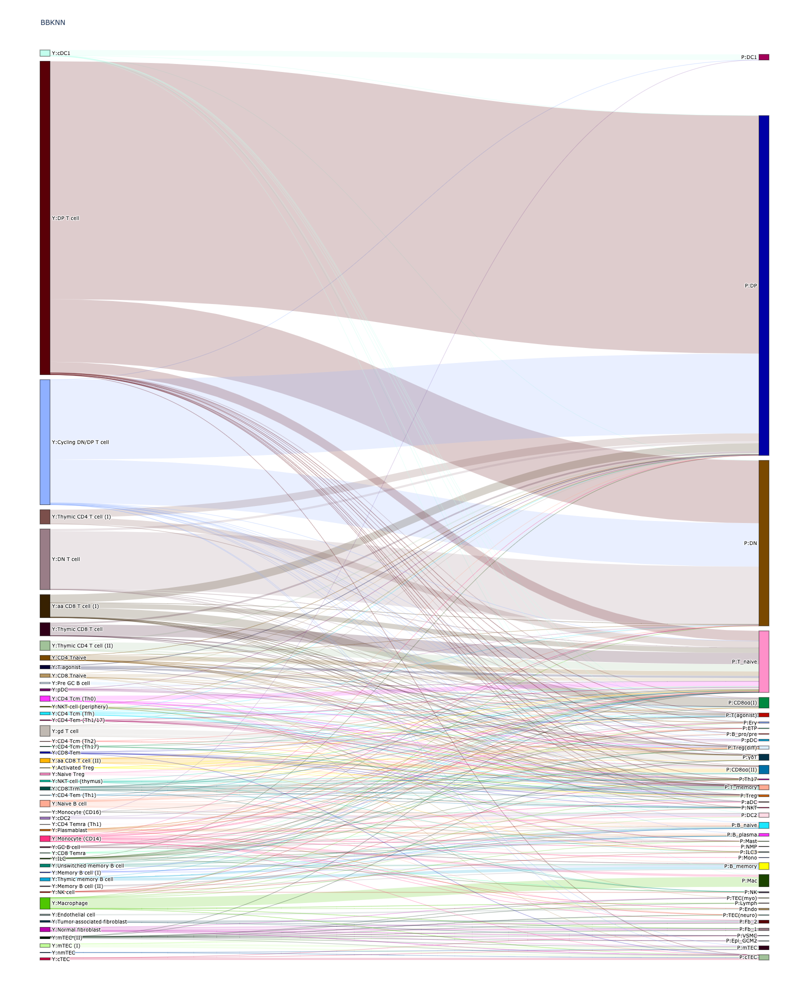

In [36]:
import plotly.graph_objects as go

fig = go.Figure(data=[go.Sankey(
    node = dict(
      pad = 10,
      thickness = 20,
      line = dict(color = "black", width = 0.5),
      label = list(dict_ind.keys()),
      color = list(adata_yy.uns['minor_cluster_colors']) + list(adata_yy.uns['cluster_colors'])
    ),
    link = dict(
      source = [dict_ind[k] for k in df_cross_melt['minor_cluster']],
      target = [dict_ind[k] for k in df_cross_melt['cluster']],
      value = list(df_cross_melt['value']),
      color = ["rgba({},{},{},0.2)".format(int(c.lstrip('#')[0:2], 16), int(c.lstrip('#')[2:4], 16), 
                                           int(c.lstrip('#')[4:6], 16)) for c in df_cross_melt['color']]
  ))])

fig.update_layout(title_text="BBKNN", font_size=10,  width=500, height=2000,)
fig.show()

In [37]:
fig.write_html("scanpy/210430_merged_thymoma_MG21.22.23.03/Sankey_Yasumizu_Park.html")

In [38]:
fig.write_image("scanpy/210430_merged_thymoma_MG21.22.23.03/Sankey_Yasumizu_Park.png")